In [1]:
import pandas as pd
import pygmt
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
from matplotlib.colors import ListedColormap
import seaborn as sns
import numpy as np
from scipy.stats import linregress

In [2]:
geo_wa=pd.read_csv('./geological_map/waor_station_geology.csv')
geo_wa.head(5)

,netst,stlo,stla,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CC.ASBU,-121.368401,43.820560,POINT (-121.368401 43.82056),9310.0,OR,Qyb,Qyb;0,ORQyb;0,Youngest basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
1,CC.BRSP,-121.708427,45.401550,POINT (-121.708427 45.40155),5175.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
2,CC.CARB,-122.005409,46.988319,POINT (-122.005409 46.988319),310.0,WA,E2,EO2;0,WAEO2;0,Lower upper Eocene marine and nonmarine rocks,...,NaN,WA097,"Raines, Gary L., and Johnson, Bruce R., 1996, ...","Sedimentary, clastic",https://pubs.usgs.gov/of/1995/of95-684/,https://ngmdb.usgs.gov/Prodesc/proddesc_30777.htm,NaN,NaN,23.0,53.0
3,CC.CIHL,-121.148621,43.750969,POINT (-121.148621 43.750969),5796.0,OR,Qb,Qb;0,ORQb;0,Basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
4,CC.CLBH,-122.143494,42.907745,POINT (-122.143494 42.907745),5168.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0


In [3]:
geo_ca=pd.read_csv('./geological_map/ca_station_geology.csv')
geo_ca.head(5)

,netst,stla,stlo,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CI.ALP,34.687080,-118.299461,POINT (-118.299461 34.68708),4810,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6
1,CI.ARV,35.126900,-118.830093,POINT (-118.830093 35.1269),2786,CA,M,MI;0,CAMI;0,Miocene marine rocks,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,23,6
2,CI.BAI,34.776951,-118.773354,POINT (-118.773354 34.776951),2829,CA,M,MI;0,CAMI;0,Miocene marine rocks,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,23,6
3,CI.BAK,35.344440,-119.104446,POINT (-119.104446 35.34444),4830,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6
4,CI.BBR,34.262299,-116.920753,POINT (-116.920753 34.262299),4848,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6


In [4]:
geo_in=pd.concat([geo_wa,geo_ca])

In [5]:
geo_df=geo_in[['netst',
               'stlo',
               'stla',
               'STATE',
               'GENERALIZE',
               'MAJOR1']]

In [6]:
geo_df.dropna(subset=['GENERALIZE'],inplace=True)

/tmp/ipykernel_1748671/2092695932.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_df.dropna(subset=['GENERALIZE'],inplace=True)


In [7]:
rock_types=geo_df['GENERALIZE'].unique()
rock_types

array(['Igneous, volcanic', 'Sedimentary, clastic',
       'Unconsolidated, undifferentiated', 'Igneous, undifferentiated',
       'Igneous, intrusive',
       'Metamorphic and Sedimentary, undifferentiated',
       'Metamorphic, sedimentary', 'Water',
       'Igneous and Sedimentary, undifferentiated',
       'Metamorphic, serpentinite', 'Metamorphic, schist',
       'Metamorphic, sedimentary clastic',
       'Unconsolidated and Sedimentary, undifferentiated',
       'Sedimentary, carbonate', 'Metamorphic, volcanic',
       'Metamorphic, gneiss', 'Igneous and Metamorphic, undifferentiated',
       'Sedimentary, undifferentiated'], dtype=object)

In [8]:
geo_df2 = geo_df.dropna(subset=['stlo', 'stla', 'GENERALIZE'])

geo_colors = {
    # **Unconsolidated Rocks** (Yellow to orange gradient)
    'Unconsolidated, undifferentiated': '#FFEB3B',   # Bright yellow (light yellow)
    'Unconsolidated and Sedimentary, undifferentiated': '#FF9800',  # Orange (for undifferentiated sediments)

    # **Sedimentary Rocks** (Yellow-based to orange and brown tones)
    'Sedimentary, clastic': '#FFB300',               # Amber yellow (clastic sedimentary)
    'Sedimentary, carbonate': '#FBC02D',             # Golden yellow (carbonate sedimentary)
    'Sedimentary, undifferentiated': '#F57C00',      # Burnt orange (undifferentiated sedimentary)

    # **Igneous Rocks** (Red-based for volcanic and purple-based for intrusive)
    'Igneous, volcanic': '#D32F2F',                  # Deep red (for volcanic)
    'Igneous, intrusive': '#9C27B0',                 # Purple-based (for intrusive igneous)
    'Igneous, undifferentiated': '#E57373',          # Light red (undifferentiated igneous)
    'Igneous and Sedimentary, undifferentiated': '#F06292', # Pinkish red (mixed igneous and sedimentary)

    # **Metamorphic Rocks** (Green-based with variations)
    'Metamorphic, sedimentary': '#66BB6A',           # Light green (for sedimentary metamorphics)
    'Metamorphic, schist': '#2E7D32',                # Deep green (for schist)
    'Metamorphic, serpentinite': '#81C784',          # Soft green (for serpentinite)
    'Metamorphic, volcanic': '#388E3C',              # Forest green (for volcanic metamorphics)
    'Metamorphic, gneiss': '#1B5E20',                # Dark green (for gneiss)
    'Metamorphic and Sedimentary, undifferentiated': '#43A047', # Medium green (undifferentiated metamorphics)
    'Metamorphic, sedimentary clastic': '#4CAF50',   # Fresh green (for clastic metamorphics)
    'Igneous and Metamorphic, undifferentiated': '#8E24AA', # Violet-green mix (for igneous/metamorphic undifferentiated)

    # **Water** (Clear and bright blue)
    'Water': '#80D8FF',                              # Soft turquoise-blue (for water)

    # **NaN or Missing Data** (Neutral gray)
    None: '#BDBDBD',                                 # Light gray for undefined or NaN entries
    # 'nan': '#BDBDBD'                                 # Handling 'nan' as a string explicitly if needed
}



# Map geological units to colors
geo_df2['color'] = geo_df2['GENERALIZE'].map(geo_colors).fillna('#d3d3d3') 


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


Unconsolidated, undifferentiated #FFEB3B
Unconsolidated and Sedimentary, undifferentiated #FF9800
Sedimentary, clastic #FFB300
Sedimentary, carbonate #FBC02D
Sedimentary, undifferentiated #F57C00
Igneous, volcanic #D32F2F
Igneous, intrusive #9C27B0
Igneous, undifferentiated #E57373
Igneous and Sedimentary, undifferentiated #F06292
Metamorphic, sedimentary #66BB6A
Metamorphic, schist #2E7D32
Metamorphic, serpentinite #81C784
Metamorphic, volcanic #388E3C
Metamorphic, gneiss #1B5E20
Metamorphic and Sedimentary, undifferentiated #43A047
Metamorphic, sedimentary clastic #4CAF50
Igneous and Metamorphic, undifferentiated #8E24AA
Water #80D8FF
None #BDBDBD


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


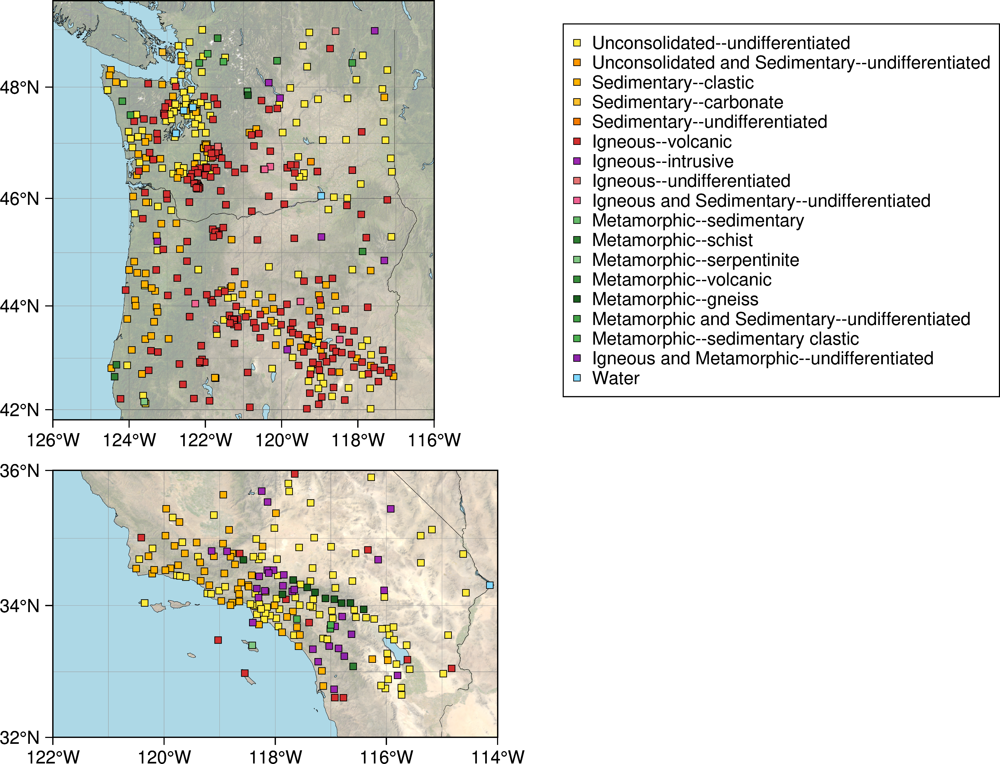

In [9]:
# PyGMT Plot
fig = pygmt.Figure()
region=[-126,-116,41.8,49.5]
proj='M6c'

pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.5p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='8p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)

# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    print(unit, color)
    geo_plot = geo_df2[geo_df2['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo'],
                y=geo_plot['stla'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=f'{formatted_label}'
        )

fig.legend(position="JMR+o0.8i/0i", box="+gwhite+p0.4p")
# fig.shift_origin(xshift="7c")
fig.shift_origin(yshift="-5c")
proj='M7c'
region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.5p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='8p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    # print(unit, color)
    geo_plot = geo_df2[geo_df2['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo"],
            y=geo_plot["stla"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.show(dpi=600)



In [10]:
print(geo_df.MAJOR1.unique())

['Basaltic-andesite' 'Siltstone' 'Basalt' 'Rhyolite' 'Sandstone' 'Clay'
 'Silt' 'Andesite' 'Sand' 'Fine-detrital' 'Quartz-monzonite' 'Granite'
 'Graywacke' 'Gravel' 'Metasedimentary' nan 'Arkose' 'Mudstone' 'Gabbro'
 'Sandstone-mudstone' 'Quartz-diorite' 'Coarse-detrital' 'Mixed-clastic'
 'Serpentinite' 'Pelitic-schist' 'Volcanic' 'Phyllite' 'Conglomerate'
 'Limestone' 'Greenstone' 'Gneiss' 'Metaandesite' 'Hypabyssal-basalt'
 'Plutonic' 'Orthogneiss' 'Shale' 'Anorthosite' 'Tonalite' 'Argillite'
 'Felsic-volcanic' 'Granodiorite' 'Diorite' 'Hypabyssal-rhyolite' 'Dacite']


In [11]:
geo_major = geo_df.dropna(subset=['stlo', 'stla', 'MAJOR1'])

# Define color dictionary for geological units
major_colors = {
    # **Sedimentary Rocks** (Yellow-based gradient, yellow to orange)
    'Siltstone': '#FFEB3B',              # Bright yellow
    'Sandstone': '#FFB300',              # Darker yellow-orange
    'Clay': '#FF6F00',                  # Deep amber-orange
    'Silt': '#FFF176',                  # Pale yellow (lighter)
    'Fine-detrital': '#FF9800',          # Strong orange
    'Graywacke': '#FF5722',             # Orange-red
    'Arkose': '#F57C00',                # Intense amber-orange
    'Mudstone': '#E65100',              # Dark amber-orange
    'Conglomerate': '#D32F2F',          # Red-orange
    'Limestone': '#FF7043',             # Peachy-orange
    'Sandstone-mudstone': '#FF5722',    # Reddish-orange
    'Mixed-clastic': '#E64A19',         # Orange-red
    'Coarse-detrital': '#BF360C',       # Dark orange-red
    'Shale': '#F9A825',                 # Amber-yellow with slight orange
    'Gravel': '#B59A5B',                # Beige with brown undertones
    'Argillite': '#FF6F00',             # Amber-orange
    'Sand': '#FFB300',                 # Darker yellow-orange

    # **Volcanic Rocks** (Purple-based gradient, dark purple to lavender)
    'Basaltic-andesite': '#512DA8',     # Dark purple
    'Basalt': '#3F51B5',                # Dark bluish purple
    'Rhyolite': '#5E35B1',              # Medium dark purple
    'Andesite': '#7E57C2',              # Medium purple
    'Granite': '#9C27B0',               # Vibrant purple
    'Volcanic': '#8E24AA',              # Purple-pink
    'Metaandesite': '#9C27B0',          # Rich purple
    'Hypabyssal-basalt': '#7B1FA2',     # Deep purple with pinkish tint
    'Hypabyssal-rhyolite': '#AB47BC',   # Lavender purple
    'Dacite': '#512DA8',                # Dark purple, same as basaltic-andesite
    'Granodiorite': '#4CAF50',          # Purple with brownish tones

    # **Metamorphic Rocks** (Green-based gradient)
    'Metasedimentary': '#66BB6A',       # Light green
    'Pelitic-schist': '#4CAF50',         # Medium green
    'Serpentinite': '#2E7D32',           # Dark green
    'Phyllite': '#388E3C',              # Medium dark green
    'Gneiss': '#2C6B31',                # Deep green
    'Schist': '#1B5E20',                # Dark green
    'Mica-schist': '#388E3C',           # Rich green
    'Slate': '#43A047',                 # Bright green
    'Metamorphic': '#1B5E20',           # Dark forest green
    'Amphibolite': '#2E7D32',           # Deep green with slight yellow
    'Orthogneiss': '#66BB6A',           # Soft green, slightly grayish

    # **Other Rock Types**
    'Water': '#80D8FF',                # Soft turquoise-blue
    'Greenstone': '#A8D58B',           # Soft mint green
    'Plutonic': '#388E3C',             # Greenish stone-like, similar to Metamorphic
    'Anorthosite': '#80D8FF',          # Turquoise-greenish
    'Tonalite': '#9C27B0',             # Purple hue with slight bluish tinge
    'Quartz-monzonite': '#9C27B0',     # Vibrant purple, same as granite
    'Gabbro': '#3F51B5',               # Bluish dark green
    'Quartz-diorite': '#512DA8',       # Dark purple with grayish tones
    'Diorite': '#7E57C2',              # Medium purple
    'Felsic-volcanic': '#9C27B0',      # Bright vibrant purple, similar to granite
}



# Map geological units to colors
geo_major['color'] = geo_major['MAJOR1'].map(major_colors).fillna('#d3d3d3') 


/tmp/ipykernel_1748671/1836539442.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_major['color'] = geo_major['MAJOR1'].map(major_colors).fillna('#d3d3d3')


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


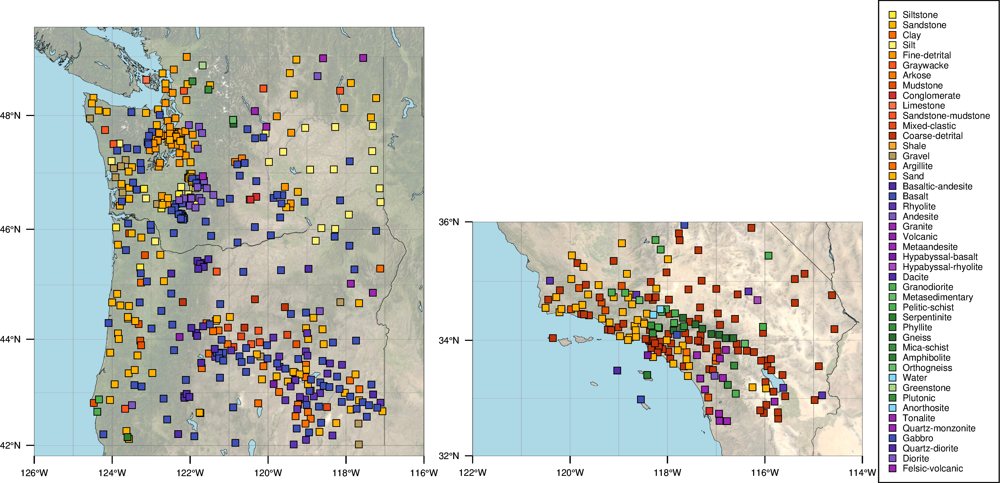

In [12]:
# Load CSV data
df = geo_major
region=[-126,-116,41.8,49.5]
proj='M6c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
            
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = geo_major[geo_major['color'] == color]
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo'],
                y=geo_plot['stla'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=unit
                )
fig.shift_origin(xshift="7c")
fig.legend(position="JMR", box="+gwhite+p0.4p",)
fig.shift_origin(xshift="-0.25c")

region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = geo_major[geo_major['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo"],
            y=geo_plot["stla"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.show(dpi=600)

In [13]:
pd_pnwbb=pd.read_csv('attenuation_PNW/sta_waro_vs30.csv')
pd_cabb=pd.read_csv('attenuation_SouthCA/sta_CI_vs30.csv')
pd_comb=pd.concat([pd_pnwbb,pd_cabb])

In [14]:
# Merging pd1 with pd2 on the 'netst' column
merged_geo = pd_comb.merge(geo_df, on='netst', how='left')
merged_geo = merged_geo[merged_geo.meanb > 0.01]

# Display the merged DataFrame
merged_geo.to_csv('merged_geo.csv', index=False)

In [15]:
merged_geo.head(5)

,Unnamed: 0,fband,netst,stlo_x,stla_x,meanb,meanQ,ncount,nearest_lon,nearest_lat,vs30,stlo_y,stla_y,STATE,GENERALIZE,MAJOR1
0,0,0.5-1.0,LI.LTH,-119.417679,46.461700,0.080000,58.905,2,-119.4174,46.4613,266.2870,-119.417679,46.461700,WA,"Unconsolidated, undifferentiated",Fine-detrital
2,2,0.5-1.0,TA.I05A,-121.267502,44.162601,0.316667,14.894,3,-121.2674,44.1633,425.7540,-121.267502,44.162601,OR,"Unconsolidated, undifferentiated",Clay
5,5,0.5-1.0,XN.B05,-125.766998,58.930500,0.050000,94.248,1,-123.0833,49.0012,324.2436,NaN,NaN,NaN,NaN,NaN
6,6,0.5-1.0,XN.B12,-131.744400,59.932999,0.110000,42.840,1,-124.7213,48.3872,605.8344,NaN,NaN,NaN,NaN,NaN
7,7,0.5-1.0,XN.C02,-122.713898,58.096500,0.020000,235.619,1,-122.7133,49.0012,426.8878,NaN,NaN,NaN,NaN,NaN


In [16]:
# Map geological units to colors
merged_geo['color_major'] = merged_geo['MAJOR1'].map(major_colors).fillna('#d3d3d3') 
merged_geo['color_gener'] = merged_geo['GENERALIZE'].map(geo_colors).fillna('#d3d3d3') 


In [17]:
# -122, -121.4, 46.7, 47
MtRainer=merged_geo[(merged_geo.stlo_x >-122) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >46.7) & (merged_geo.stla_x <47)]
# -121.9, -121.4, 45, 45.5
MtHood=merged_geo[(merged_geo.stlo_x >-121.9) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >45) & (merged_geo.stla_x <45.5)]
# -122.4, -121.9, 46, 46.4
MtStHelens=merged_geo[(merged_geo.stlo_x >-122.45) & (merged_geo.stlo_x <-121.9) & (merged_geo.stla_x >46) & (merged_geo.stla_x <46.4)]


In [18]:
print("MtStHelens-----")
for k, freq in enumerate(MtStHelens.fband.unique()):
    pdin=MtStHelens[MtStHelens.fband == freq]
    print((pdin.describe()))
print("MtHood-----")
for k, freq in enumerate(MtHood.fband.unique()):
    pdin=MtHood[MtHood.fband == freq]
    print((pdin.describe()))
print("MtRainer-----")
for k, freq in enumerate(MtRainer.fband.unique()):
    pdin=MtRainer[MtRainer.fband == freq]
    print((pdin.describe()))


MtStHelens-----
       Unnamed: 0      stlo_x     stla_x     meanb       meanQ    ncount  \
count    4.000000    4.000000   4.000000  4.000000    4.000000  4.000000   
mean   162.750000 -122.215569  46.224879  0.209375  118.265125  4.250000   
std     82.588841    0.054114   0.040849  0.083101  196.607344  2.872281   
min     48.000000 -122.296669  46.199780  0.102500   16.250000  1.000000   
25%    145.500000 -122.217310  46.200094  0.166250   17.866625  3.250000   
50%    179.000000 -122.190052  46.207209  0.222500   21.845500  4.000000   
75%    196.250000 -122.188311  46.231994  0.265625  122.244000  5.000000   
max    245.000000 -122.185501  46.285320  0.290000  413.119500  8.000000   

       nearest_lon  nearest_lat        vs30      stlo_y     stla_y  
count     4.000000     4.000000    4.000000    4.000000   4.000000  
mean   -122.215900    46.224300  771.343125 -122.215569  46.224879  
std       0.054391     0.041199  208.306976    0.054114   0.040849  
min    -122.297400    4

In [19]:
# ! pip install geodatasets


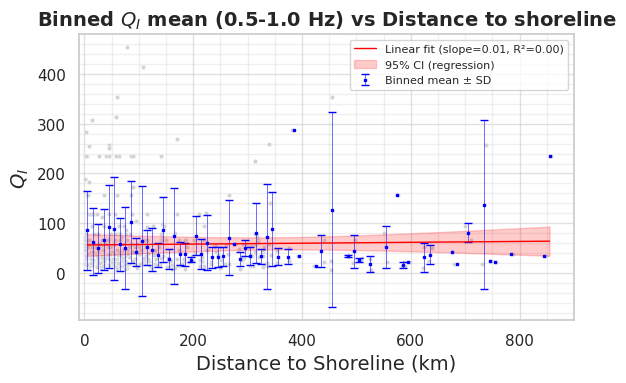

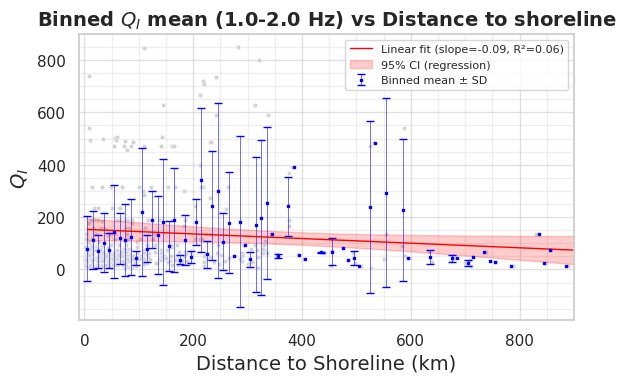

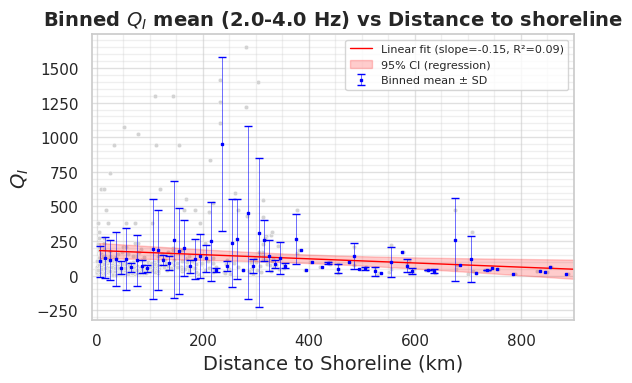

In [20]:
import geopandas as gpd
import geodatasets
from shapely.geometry import Point
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import linregress, t

for k, freq in enumerate(merged_geo.fband.unique()):
    
    single_pnwbb=merged_geo.loc[merged_geo.fband == freq]

    # -----------------------------
    # 1. Prepare Data
    # -----------------------------
    df = single_pnwbb.copy()  # your dataframe with 'stlo_x', 'stla_x', 'meanQ'

    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['stlo_x'], df['stla_x']),
        crs="EPSG:4326"
    )

    # Load coastline
    coast = gpd.read_file(geodatasets.get_path("naturalearth.land"))
    coastline = coast.boundary.union_all()

    # Compute approximate distance to shoreline in km
    gdf['dist_to_shore_km'] = gdf.geometry.apply(lambda p: p.distance(coastline) * 111)


    # -----------------------------
    # 1. Binning
    # -----------------------------
    bin_width = 10
    max_dist = gdf['dist_to_shore_km'].max()
    bins = np.arange(0, max_dist + bin_width, bin_width)
    labels = bins[:-1] + bin_width / 2
    gdf['dist_bin'] = pd.cut(gdf['dist_to_shore_km'], bins=bins, labels=labels)
    # gdf = gdf[gdf['dist_to_shore_km'] <= 400]
    
    binned = gdf.groupby('dist_bin', observed=False)['meanQ'].agg(['mean','median', 'std', 'count']).reset_index()
    binned['dist_bin'] = binned['dist_bin'].astype(float)
    binned_valid = binned.dropna(subset=['mean'])

    # -----------------------------
    # 2. Regression on binned mean
    # -----------------------------
    # binned_valid = binned[binned['count'] >= 3].dropna(subset=['median'])

    x = binned_valid['dist_bin'].values
    y = binned_valid['mean'].values
    slope, intercept, r_value, p_value, std_err = linregress(x, y)

    # Predicted values
    y_pred = intercept + slope * x

    # Degrees of freedom
    n = len(x)
    df = n - 2

    # Standard error of regression
    residuals = y - y_pred
    s_err = np.sqrt(np.sum(residuals**2) / df)

    # 95% confidence interval for regression line
    t_val = t.ppf(0.975, df)  # two-tailed 95%
    ci = t_val * s_err * np.sqrt(1/n + (x - np.mean(x))**2 / np.sum((x - np.mean(x))**2))

    # Upper and lower bounds
    y_upper = y_pred + ci
    y_lower = y_pred - ci

    # -----------------------------
    # 3. Plot
    # -----------------------------
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(6,4), dpi=100)

    # Raw points
    sns.scatterplot(data=gdf, x='dist_to_shore_km', y='meanQ', color='lightgray', s=10)

    # Binned mean
    plt.errorbar(
        x, y,
        yerr=binned_valid['std'],  # ±SD
        fmt='s', markersize=2, color='blue', ecolor='blue',linewidth=0.4,  capsize=3, label='Binned mean ± SD'
    )

    # Regression line
    plt.plot(x, y_pred, color='red', linewidth=1, label=f'Linear fit (slope={slope:.2f}, R²={r_value**2:.2f})')

    # 95% CI shading
    plt.fill_between(x, y_lower, y_upper, color='red', alpha=0.2, label='95% CI (regression)')

    # Labels
    plt.xlabel("Distance to Shoreline (km)", fontsize=14)
    plt.ylabel("$Q_I$", fontsize=14)
    plt.title(f"Binned $Q_I$ mean ({freq} Hz) vs Distance to shoreline", fontsize=14, weight='bold')

    plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
    plt.grid(which='minor', alpha=0.3)
    plt.grid(which='major', alpha=0.6)

    plt.legend(fontsize=8, loc='upper right')
    plt.tight_layout()
    # plt.ylim(-5,800)
    plt.xlim(-10,900)
    # plt.savefig("Qi_vs_distance_regression.png", dpi=300)
    plt.show()



In [77]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import geodatasets

# -----------------------------
# 0. Calculate distance to shoreline
# -----------------------------
df = merged_geo.copy()
df = df.dropna(subset=['meanQ', 'vs30', 'GENERALIZE', ])

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['stlo_x'], df['stla_x']), crs="EPSG:4326")

# Load coastline
coast = gpd.read_file(geodatasets.get_path("naturalearth.land"))
coastline = coast.boundary.unary_union  # union of all land boundaries

# Compute approximate distance to shore in km
gdf['dist_to_shore_km'] = gdf.geometry.apply(lambda p: p.distance(coastline) * 111)

# Now use gdf for clustering
df = gdf.dropna(subset=['dist_to_shore_km'])
print(f"Filtered dataset: {len(df)} stations (sedimentary & unconsolidated only)")

# -----------------------------
# 1. Loop over frequency bands
# -----------------------------
clustered_dfs = {}  # store clustered data per freq

for freq in df.fband.unique():
    df_freq = df[df.fband == freq].copy()
    if len(df_freq) < 10:
        print(f"Skipping {freq}: too few data points")
        continue
    
    print(f"\n===== Frequency band: {freq} =====")
    
    # -----------------------------
    # 1a. Prepare features for clustering
    # -----------------------------
    numeric_features = df_freq[['meanQ', 'vs30', 'dist_to_shore_km']].copy()
    geo_features = pd.get_dummies(df_freq[['GENERALIZE',]], drop_first=True)
    features = pd.concat([numeric_features, geo_features], axis=1)
    
    # Standardize numeric & encoded features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(features)
    
    # -----------------------------
    # 1b. Determine optimal number of clusters via silhouette score
    # -----------------------------
    best_k, best_score = 0, -1
    for k in range(2, 8):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X_scaled)
        score = silhouette_score(X_scaled, labels)
        if score > best_score:
            best_k, best_score = k, score
    print(f"Optimal clusters: {best_k} (Silhouette = {best_score:.3f})")
    
    # -----------------------------
    # 1c. Apply final KMeans clustering
    # -----------------------------
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    df_freq['cluster'] = kmeans.fit_predict(X_scaled)
    
    # -----------------------------
    # 1d. Numeric summary per cluster
    # -----------------------------
    summary_numeric = df_freq.groupby('cluster')[['meanQ', 'vs30', 'dist_to_shore_km']].agg(['mean', 'std', 'count'])
    print("Numeric cluster summary:")
    print(summary_numeric)
    
    # -----------------------------
    # 1e. Geological composition per cluster
    # -----------------------------
    cat_cols = ['GENERALIZE']
    cluster_cat_summary = {}
    for c in range(best_k):
        cluster_data = df_freq[df_freq['cluster'] == c]
        cluster_cat_summary[c] = {}
        for col in cat_cols:
            counts = cluster_data[col].value_counts(normalize=True) * 100
            cluster_cat_summary[c][col] = counts.to_dict()
    print("\nCategorical cluster feature distribution (%):")
    for c, d in cluster_cat_summary.items():
        print(f"\nCluster {c}:")
        for col, dist in d.items():
            print(f"  {col}: {dist}")
    
    clustered_dfs[freq] = df_freq


/tmp/ipykernel_1748671/3046604512.py:20: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  coastline = coast.boundary.unary_union  # union of all land boundaries


Filtered dataset: 1081 stations (sedimentary & unconsolidated only)

===== Frequency band: 0.5-1.0 =====
Optimal clusters: 2 (Silhouette = 0.669)
Numeric cluster summary:
             meanQ                         vs30                    \
              mean        std count        mean         std count   
cluster                                                             
0        62.357250   7.018388     2  519.753100  112.072041     2   
1        61.532444  69.183016   332  517.819859  173.045843   332   

        dist_to_shore_km                    
                    mean         std count  
cluster                                     
0             221.983668   29.177424     2  
1             151.787239  151.014157   332  

Categorical cluster feature distribution (%):

Cluster 0:
  GENERALIZE: {'Igneous and Sedimentary, undifferentiated': 100.0}

Cluster 1:
  GENERALIZE: {'Unconsolidated, undifferentiated': 34.036144578313255, 'Igneous, volcanic': 28.012048192771083, 'Sedimen


===== Plots for Frequency band: 0.5-1.0 =====


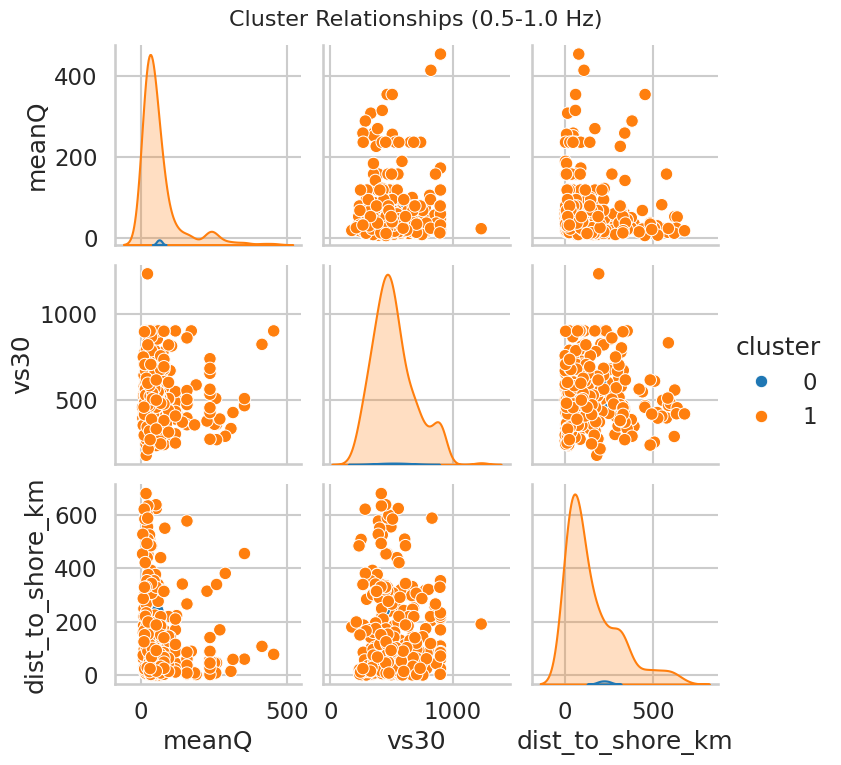

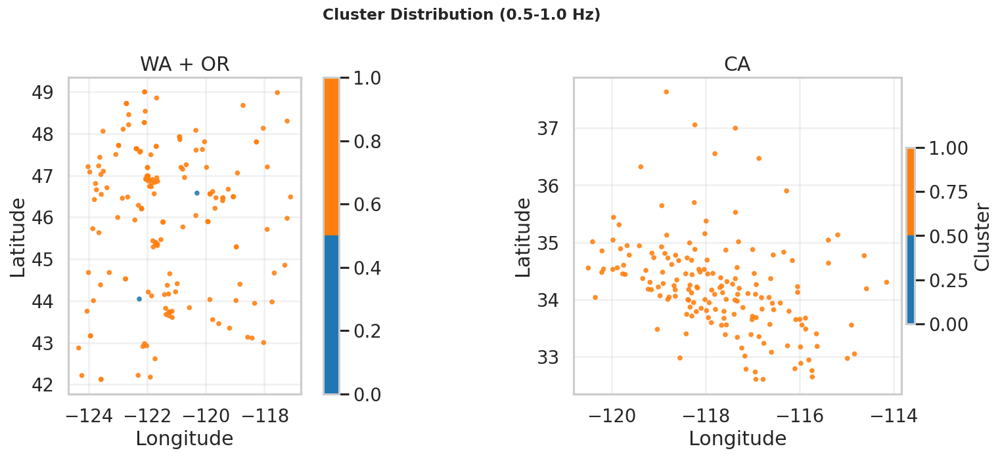

/tmp/ipykernel_1748671/3042995185.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


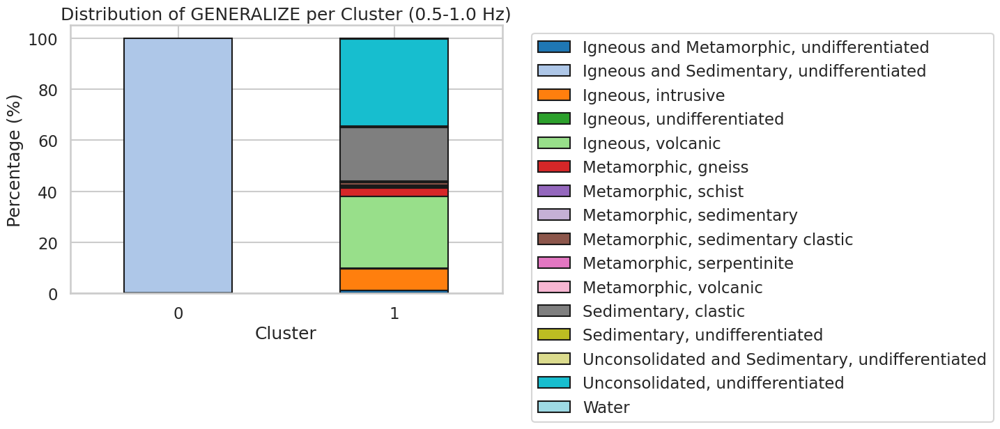


===== Plots for Frequency band: 1.0-2.0 =====


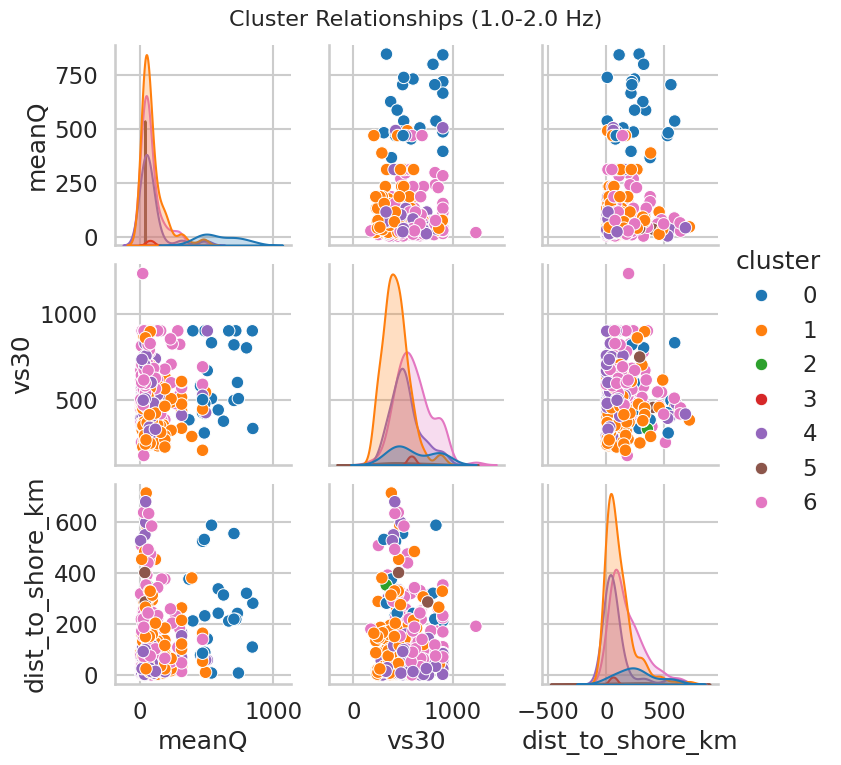

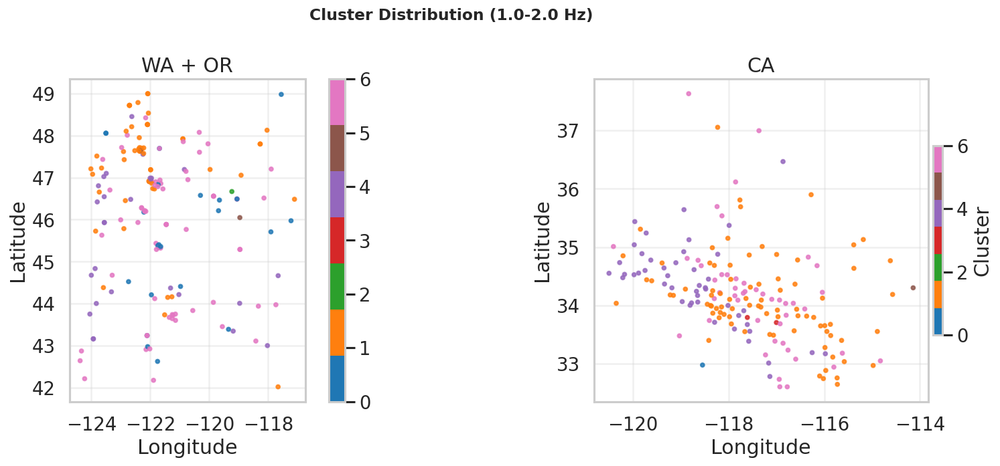

/tmp/ipykernel_1748671/3042995185.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


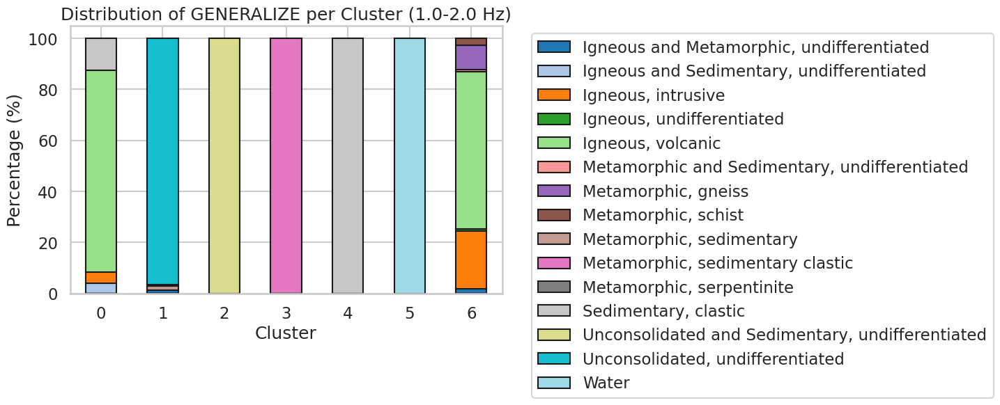


===== Plots for Frequency band: 2.0-4.0 =====


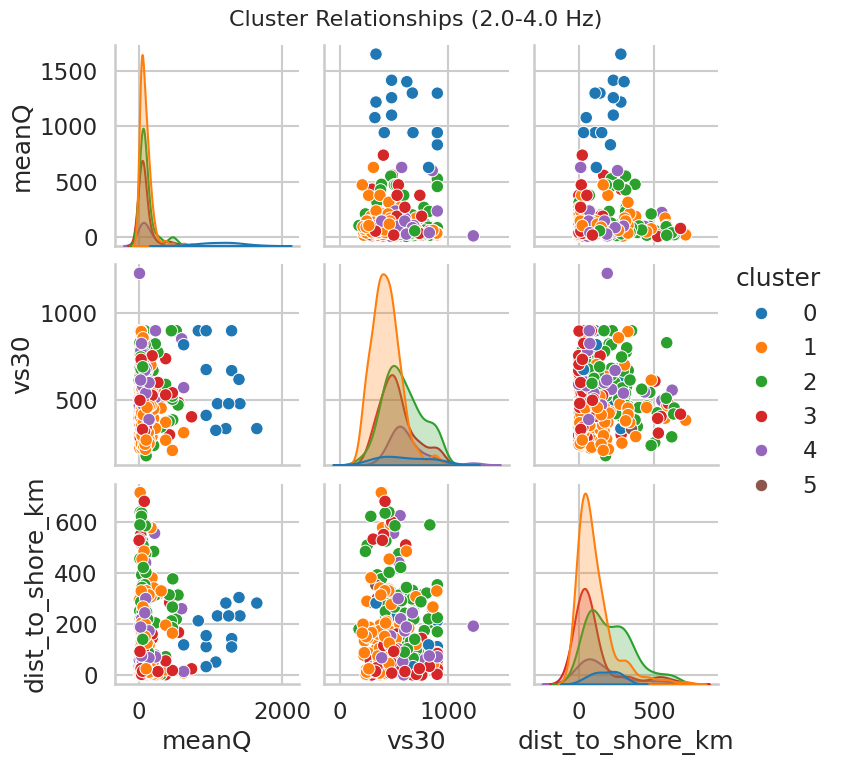

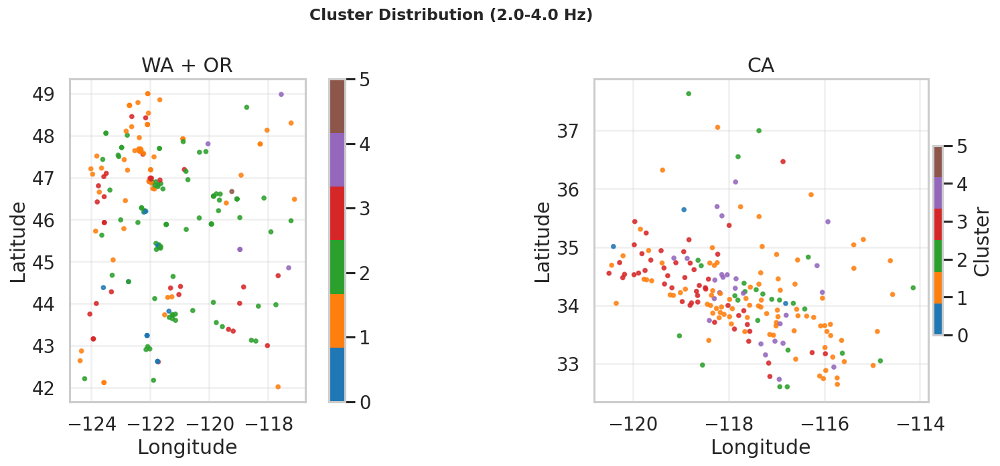

/tmp/ipykernel_1748671/3042995185.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


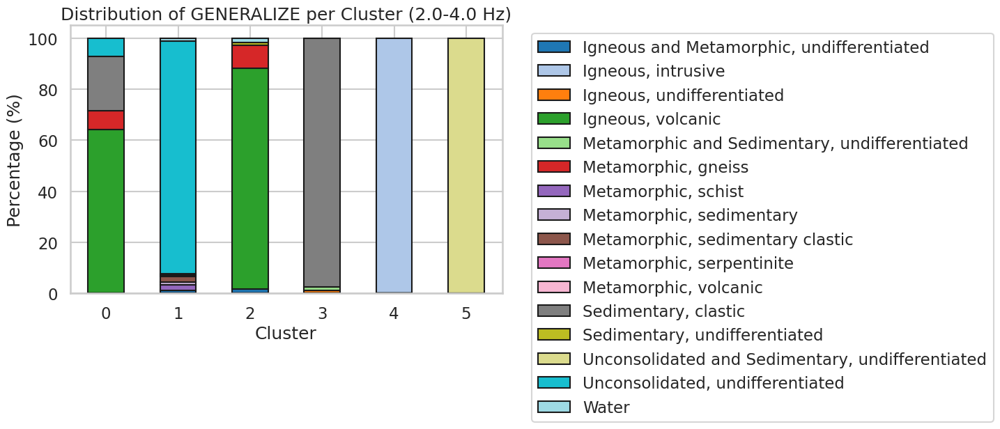

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable

# -----------------------------
# 1. Define color palette for clusters
# -----------------------------
def get_cluster_palette(num_clusters):
    palette = sns.color_palette("tab10", n_colors=num_clusters)
    cluster_colors = {i: palette[i] for i in range(num_clusters)}
    cmap = ListedColormap(palette)
    return cluster_colors, cmap

# -----------------------------
# 2. Loop over frequency bands and create plots
# -----------------------------
for freq, gdf in clustered_dfs.items():
    num_clusters = gdf['cluster'].nunique()
    cluster_colors, cmap = get_cluster_palette(num_clusters)

    print(f"\n===== Plots for Frequency band: {freq} =====")

    # -----------------------------
    # 2a. Pairplot for numeric features
    # -----------------------------
    sns.set(style="whitegrid", context="talk")
    pp = sns.pairplot(
        gdf,
        hue='cluster',
        vars=['meanQ', 'vs30', 'dist_to_shore_km'],
        diag_kind='kde',
        palette=cluster_colors
    )
    pp.fig.suptitle(f"Cluster Relationships ({freq} Hz)", y=1.02, fontsize=16)
    plt.show()

    # -----------------------------
    # 2b. Map of clusters: WA+OR vs CA
    # -----------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=120, )

    # WA + OR
    wa_or = gdf[gdf['STATE'].isin(['WA', 'OR'])]
    wa_or.plot(
        ax=axes[0],
        column='cluster',
        cmap=cmap,
        markersize=10,
        legend=True,
        alpha=0.8,
        vmin=0,
        vmax=num_clusters-1
    )
    axes[0].set_title("WA + OR")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].grid(alpha=0.3)

    # CA
    ca = gdf[gdf['STATE'] == 'CA']
    ca.plot(
        ax=axes[1],
        column='cluster',
        cmap=cmap,
        markersize=10,
        legend=False,
        alpha=0.8,
        vmin=0,
        vmax=num_clusters-1
    )
    axes[1].set_title("CA")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].grid(alpha=0.3)

    # Common colorbar
    sm = ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=num_clusters-1))
    sm._A = []
    fig.colorbar(sm, ax=axes[1], orientation='vertical', fraction=0.02, pad=0.01, label='Cluster')

    plt.suptitle(f"Cluster Distribution ({freq} Hz)", fontsize=14, weight='bold')
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # 2c. Stacked bar plots for GENERALIZE and MAJOR1
    # -----------------------------
    cat_cols = ['GENERALIZE',]
    for col in cat_cols:
        cluster_geo = gdf.groupby('cluster')[col].value_counts(normalize=True).mul(100).rename('percent').reset_index()
        cluster_geo_pivot = cluster_geo.pivot(index='cluster', columns=col, values='percent').fillna(0)

        cluster_geo_pivot.plot(
            kind='bar',
            stacked=True,
            figsize=(8, 5),
            colormap='tab20',
            edgecolor='k'
        )
        plt.ylabel('Percentage (%)')
        plt.xlabel('Cluster')
        plt.title(f"Distribution of {col} per Cluster ({freq} Hz)")
        plt.xticks(rotation=0)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()


In [28]:
from scipy.stats import kruskal

groups = [group['meanQ'].dropna() for name, group in merged_geo.groupby('GENERALIZE')]
stat, p = kruskal(*groups)
print(f"Kruskal-Wallis H={stat:.2f}, p={p:.3e}")


Kruskal-Wallis H=20.84, p=1.848e-01


Filtered dataset: 641 stations (sedimentary & unconsolidated only)

===== Frequency band: 0.5-1.0 =====
Optimal clusters: 3 (Silhouette = 0.391)
              meanQ                      meanb                        vs30  \
               mean        std count      mean       std count        mean   
cluster                                                                      
0.0       16.318047  11.519966    38  0.360009  0.137037    38  457.730618   
1.0       53.992893  24.784495   130  0.106718  0.044228   130  463.177986   
2.0      228.467313  56.637755    24  0.027069  0.010168    24  450.421700   

                          
               std count  
cluster                   
0.0      125.01707    38  
1.0      149.85570   130  
2.0      146.84680    24  


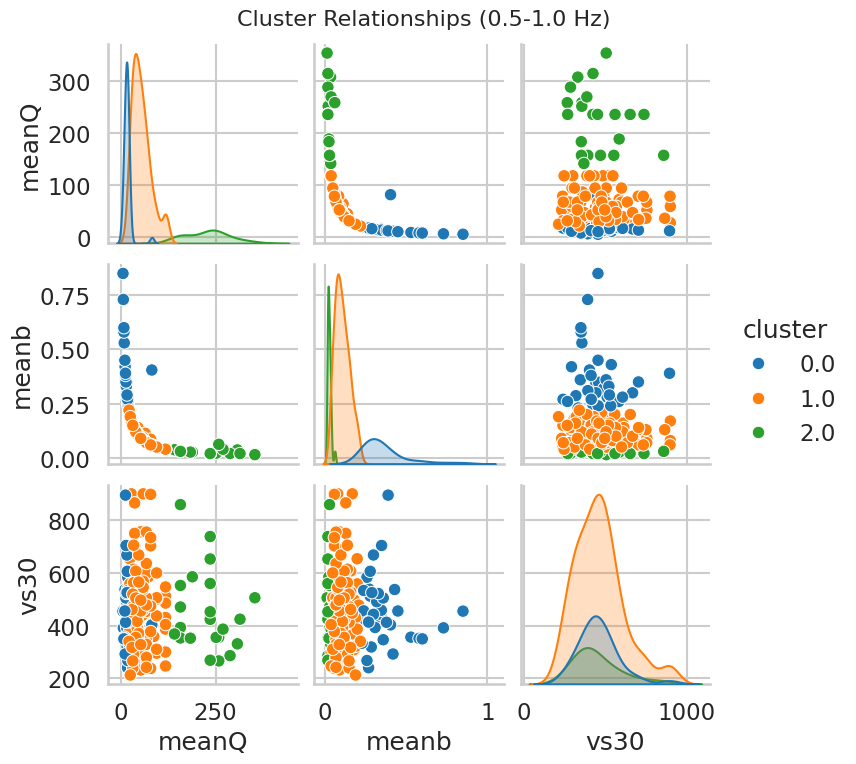

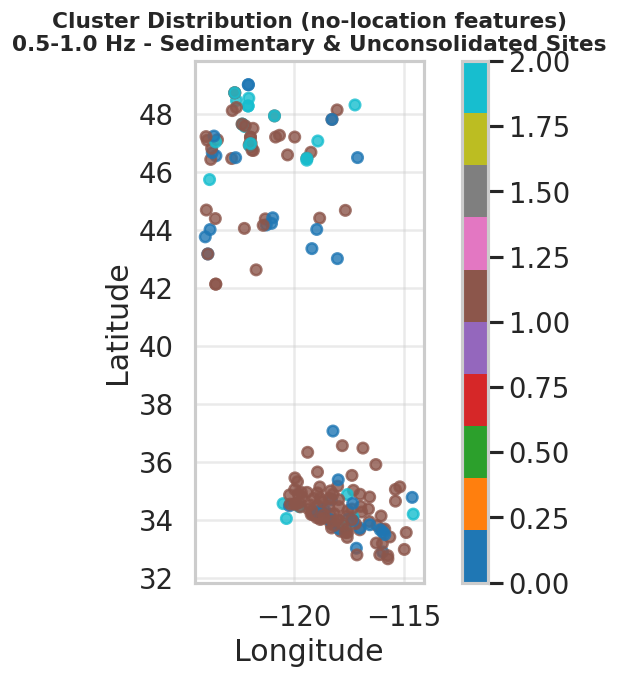


===== Frequency band: 1.0-2.0 =====
Optimal clusters: 3 (Silhouette = 0.453)
              meanQ                       meanb                        vs30  \
               mean         std count      mean       std count        mean   
cluster                                                                       
0.0       17.621655    7.345895    22  0.675341  0.272999    22  452.688109   
1.0       74.773654   47.170321   180  0.175396  0.088133   180  461.782343   
2.0      438.120978  140.528222    19  0.047456  0.043320    19  452.572700   

                           
                std count  
cluster                    
0.0      107.781319    22  
1.0      151.249697   180  
2.0      146.336777    19  


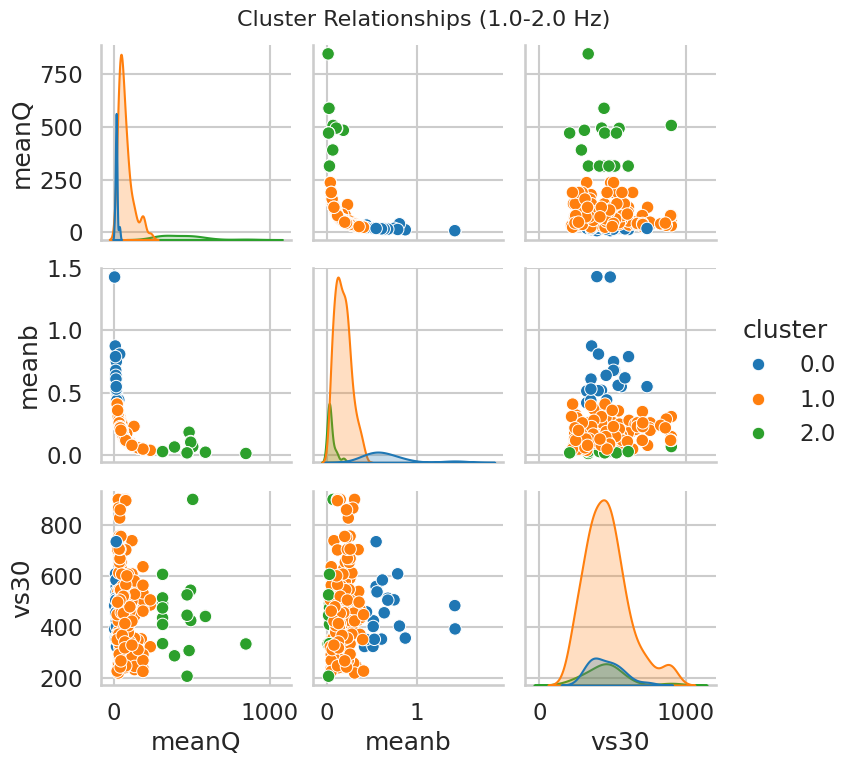

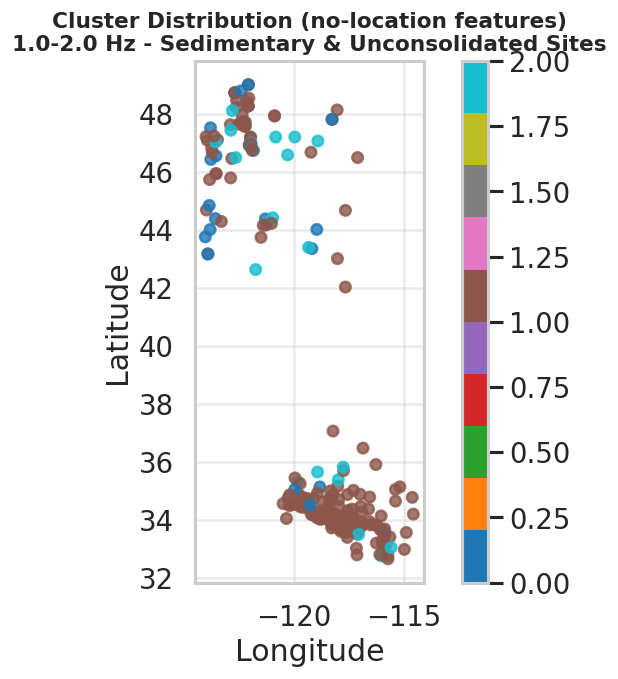


===== Frequency band: 2.0-4.0 =====
Optimal clusters: 2 (Silhouette = 0.421)
              meanQ                      meanb                        vs30  \
               mean        std count      mean       std count        mean   
cluster                                                                      
0.0       19.239957    5.80931    28  1.189643  0.504436    28  424.885679   
1.0      128.540900  192.05949   200  0.289827  0.169113   200  456.417984   

                           
                std count  
cluster                    
0.0      144.453788    28  
1.0      147.585894   200  


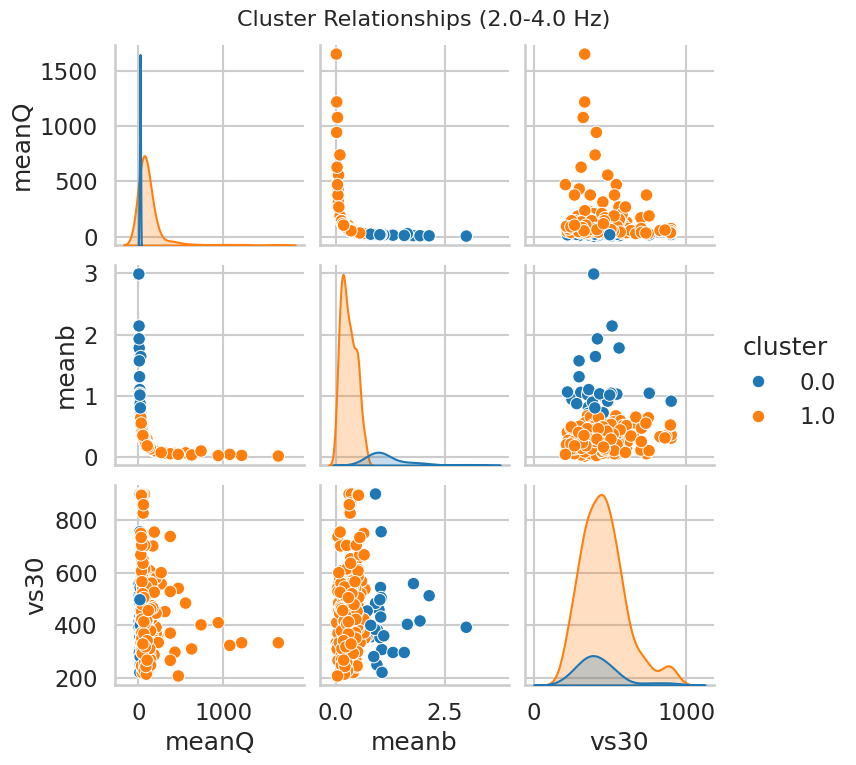

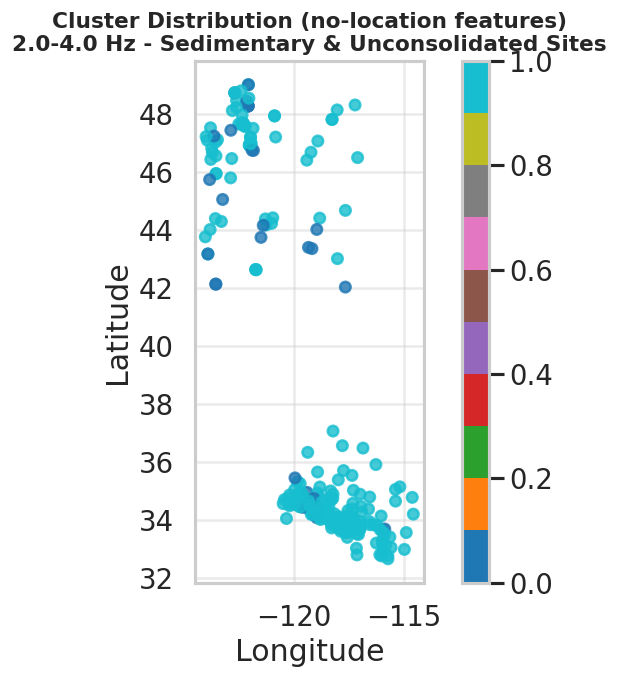

In [47]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
import numpy as np

# -----------------------------
# 1. Load and filter dataset
# -----------------------------
df = merged_geo.copy()

# Keep only sedimentary & unconsolidated sites
sedimentary_mask = df['GENERALIZE'].str.contains("Unconsolidated|Sediment", case=False, na=False)
df = df[sedimentary_mask].dropna(subset=['stlo_x', 'stla_x', 'meanQ', 'meanb', 'vs30'])

print(f"Filtered dataset: {len(df)} stations (sedimentary & unconsolidated only)")

# -----------------------------
# 2. Loop over frequency bands
# -----------------------------
for freq in df.fband.unique():
    print(f"\n===== Frequency band: {freq} =====")

    df_freq = df.loc[df.fband == freq].copy()
    if len(df_freq) < 10:
        print("Too few data points, skipping.")
        continue

    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df_freq,
        geometry=gpd.points_from_xy(df_freq['stlo_x'], df_freq['stla_x']),
        crs="EPSG:4326"
    )

    # -----------------------------
    # 3. Prepare features (NO location)
    # -----------------------------
    features = gdf[['meanQ', 'meanb', 'vs30']].dropna()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(features)

    # -----------------------------
    # 4. Find optimal number of clusters (k)
    # -----------------------------
    best_k, best_score = 0, -1
    for k in range(2, 8):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X_scaled)
        score = silhouette_score(X_scaled, labels)
        if score > best_score:
            best_k, best_score = k, score

    print(f"Optimal clusters: {best_k} (Silhouette = {best_score:.3f})")

    # -----------------------------
    # 5. Apply final KMeans clustering
    # -----------------------------
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    gdf.loc[features.index, 'cluster'] = labels

    # -----------------------------
    # 6. Summary statistics
    # -----------------------------
    summary = gdf.groupby('cluster')[['meanQ', 'meanb', 'vs30']].agg(['mean', 'std', 'count'])
    print(summary)

    # -----------------------------
    # 7. Pairplot visualization
    # -----------------------------
    sns.set(style="whitegrid", context="talk")
    pp = sns.pairplot(
        gdf,
        hue='cluster',
        vars=['meanQ', 'meanb', 'vs30'],
        diag_kind='kde',
        palette='tab10'
    )
    pp.fig.suptitle(f"Cluster Relationships ({freq} Hz)", y=1.02, fontsize=16)
    plt.show()

    # -----------------------------
    # 8. Map visualization (geographic color by cluster)
    # -----------------------------
    plt.figure(figsize=(7, 6), dpi=120)
    ax = plt.gca()
    gdf.plot(ax=ax, column='cluster', cmap='tab10', markersize=40, legend=True, alpha=0.8)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Cluster Distribution (no-location features)\n{freq} Hz - Sedimentary & Unconsolidated Sites", fontsize=13, weight='bold')
    plt.grid(alpha=0.4)
    plt.tight_layout()
    plt.show()

    # # -----------------------------
    # # 9. Save results
    # # -----------------------------
    # out_csv = f"cluster_summary_{freq.replace('.', '_')}.csv"
    # gdf.to_csv(out_csv, index=False)
    # print(f"Saved clustered GeoDataFrame: {out_csv}")


Filtered to 641 sedimentary/unconsolidated stations out of 1225 total


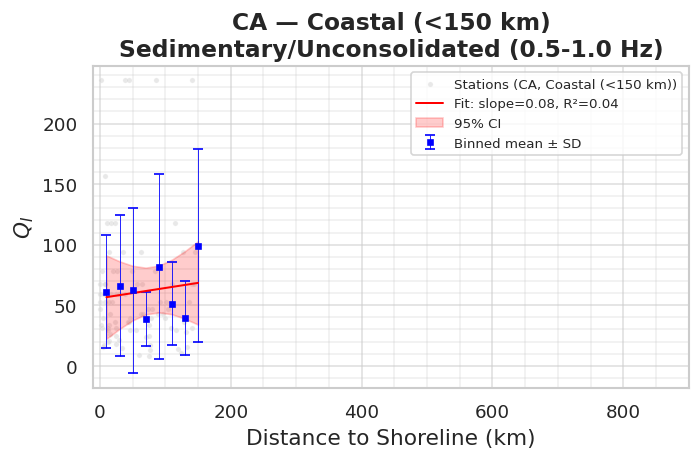

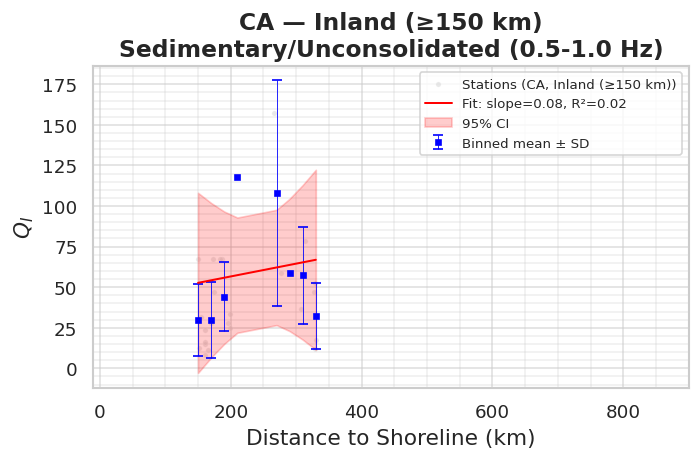

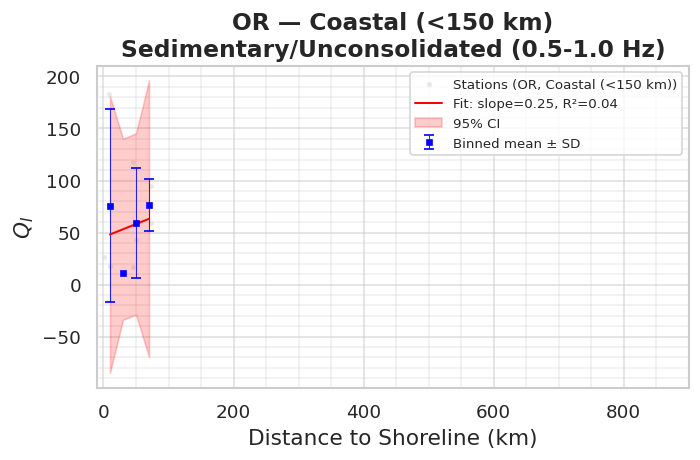

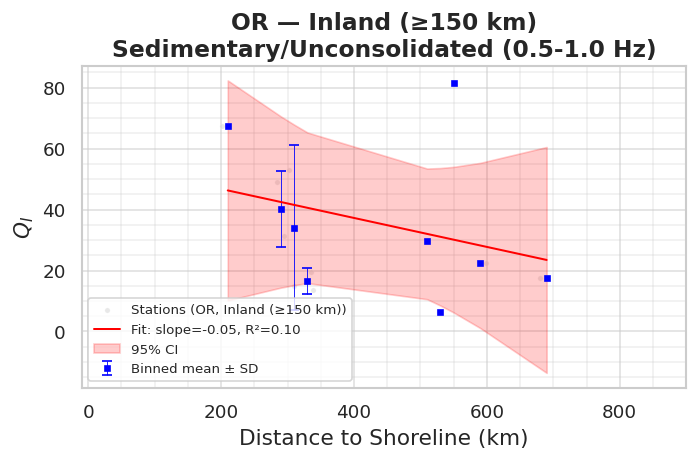

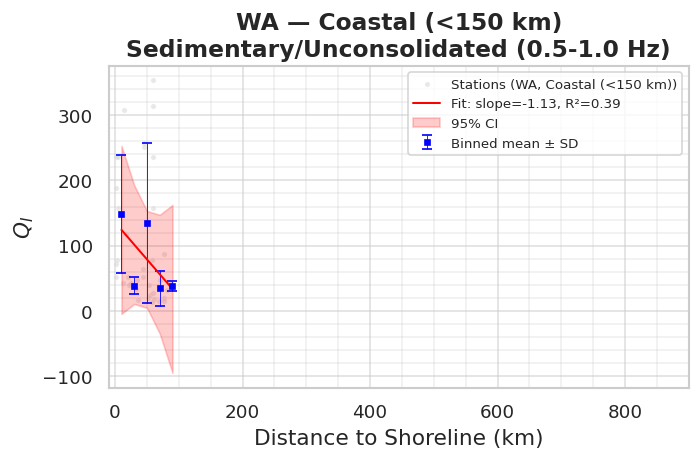

...

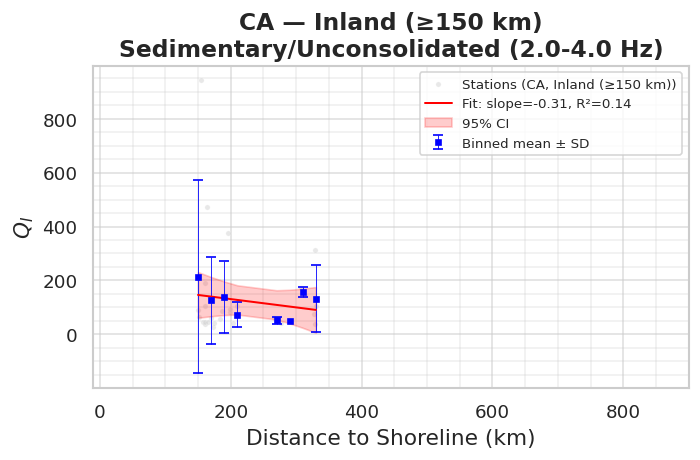

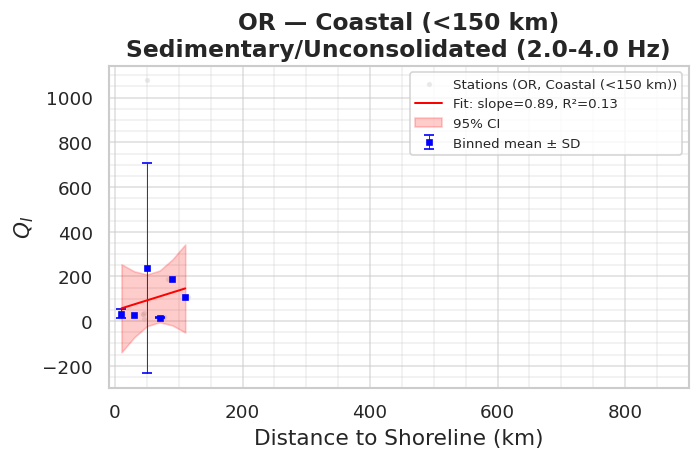

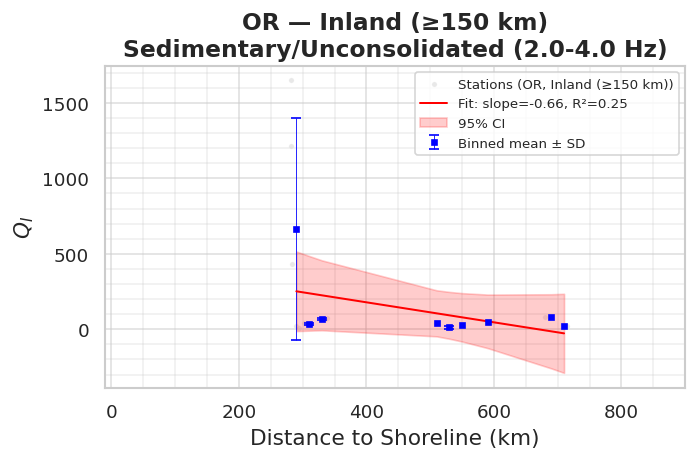

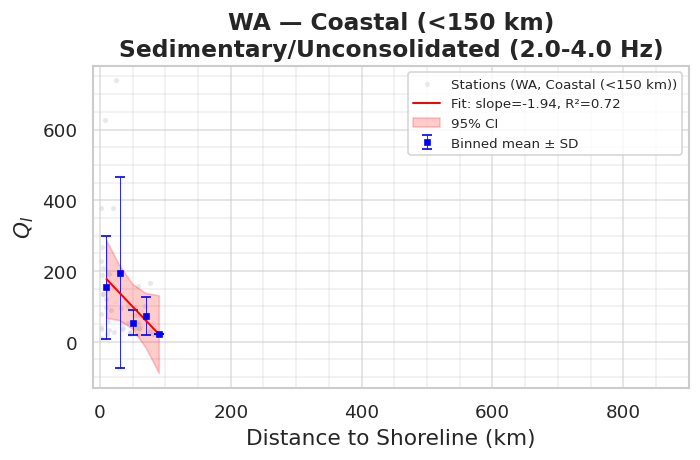

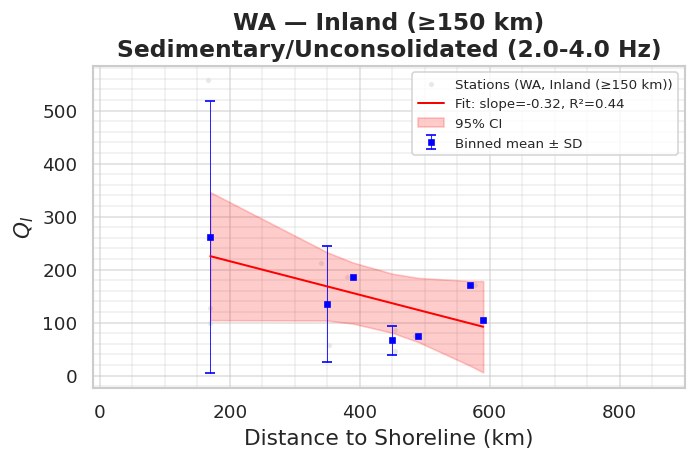

In [27]:
import geopandas as gpd
import geodatasets
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import linregress, t
from shapely.geometry import Point

# ==============================
# 1. Filter: only Sedimentary or Unconsolidated
# ==============================
merged_geo_filtered = merged_geo[
    merged_geo['GENERALIZE'].str.contains('Sedimentary|Unconsolidated', case=False, na=False)
].copy()

print(f"Filtered to {len(merged_geo_filtered)} sedimentary/unconsolidated stations out of {len(merged_geo)} total")

# ==============================
# 2. Loop by frequency
# ==============================
for freq in merged_geo_filtered.fband.unique():
    single_band = merged_geo_filtered.loc[merged_geo_filtered.fband == freq].copy()

    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        single_band,
        geometry=gpd.points_from_xy(single_band['stlo_x'], single_band['stla_x']),
        crs="EPSG:4326"
    )

    # -----------------------------
    # Load coastline (Natural Earth)
    # -----------------------------
    coast = gpd.read_file(geodatasets.get_path("naturalearth.land"))
    coastline = coast.boundary.union_all()

    # Compute distance to shoreline in km
    gdf['dist_to_shore_km'] = gdf.geometry.apply(lambda p: p.distance(coastline) * 111)

    # -----------------------------
    # Define coastal vs inland zones
    # -----------------------------
    gdf['zone'] = np.where(gdf['dist_to_shore_km'] < 150,
                           'Coastal (<150 km)',
                           'Inland (≥150 km)')

    # -----------------------------
    # Regression per State and Zone
    # -----------------------------
    for (state, zone), subset in gdf.groupby(['STATE', 'zone']):
        if subset.empty or subset['meanQ'].isna().all():
            continue

        # -----------------------------
        # Binning by distance
        # -----------------------------
        bin_width = 20
        max_dist = subset['dist_to_shore_km'].max()
        bins = np.arange(0, max_dist + bin_width, bin_width)
        labels = bins[:-1] + bin_width / 2
        subset['dist_bin'] = pd.cut(subset['dist_to_shore_km'], bins=bins, labels=labels)
        
        binned = subset.groupby('dist_bin', observed=False)['meanQ'].agg(['mean', 'std', 'count']).reset_index()
        binned['dist_bin'] = binned['dist_bin'].astype(float)
        binned_valid = binned.dropna(subset=['mean'])

        if len(binned_valid) < 3:
            continue

        # -----------------------------
        # Linear regression on binned mean
        # -----------------------------
        x = binned_valid['dist_bin'].values
        y = binned_valid['mean'].values
        slope, intercept, r_value, p_value, std_err = linregress(x, y)

        # Predictions and 95% CI
        y_pred = intercept + slope * x
        n = len(x)
        dfree = n - 2
        residuals = y - y_pred
        s_err = np.sqrt(np.sum(residuals**2) / dfree)
        t_val = t.ppf(0.975, dfree)
        ci = t_val * s_err * np.sqrt(1/n + (x - np.mean(x))**2 / np.sum((x - np.mean(x))**2))
        y_upper = y_pred + ci
        y_lower = y_pred - ci

        # -----------------------------
        # Plot
        # -----------------------------
        sns.set_theme(style="whitegrid")
        plt.figure(figsize=(6,4), dpi=120)

        # Raw points
        sns.scatterplot(data=subset, x='dist_to_shore_km', y='meanQ',
                        color='lightgray', s=10, alpha=0.5, label=f"Stations ({state}, {zone})")

        # Binned mean ± SD
        plt.errorbar(
            x, y, yerr=binned_valid['std'],
            fmt='s', markersize=3, color='blue', ecolor='blue',
            linewidth=0.5, capsize=3, label='Binned mean ± SD'
        )

        # Regression line + CI
        plt.plot(x, y_pred, color='red', linewidth=1.2,
                 label=f'Fit: slope={slope:.2f}, R²={r_value**2:.2f}')
        plt.fill_between(x, y_lower, y_upper, color='red', alpha=0.2, label='95% CI')

        # Labels and aesthetics
        plt.xlabel("Distance to Shoreline (km)", fontsize=13)
        plt.ylabel("$Q_I$", fontsize=13)
        plt.title(f"{state} — {zone}\nSedimentary/Unconsolidated ({freq} Hz)", fontsize=14, weight='bold')
        plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
        plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
        plt.grid(which='minor', alpha=0.3)
        plt.grid(which='major', alpha=0.6)
        plt.legend(fontsize=8, loc='best')
        plt.tight_layout()
        plt.xlim(-10, 900)
        plt.show()
